# EDA for Isolated Cracks

This notebook outlines the exploration, feature extraction, classification and evaluation of isolated cracks in solar cells.

In [7]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
import os
import sys
import copy
import cv2
import time
import numpy as np
import tabulate
import matplotlib.pyplot as plt
sys.path.append(os.path.join(os.path.abspath(""), ".."))

from app.utils import ImageWrapper
from app.custom import RemoveBusBars, Orient, BusbarMask
from app.transforms import FFT, IFFT, CreateOnesMask, PCA, DownsampleBlur, MaskedFFT
from app.filters import *
from app.imager import ImageLoader, DefectViewer, Show, Exposure

from app.models import Classifier
from sklearn.linear_model import LogisticRegression

In [9]:
## Notebook Utils

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA as sk_PCA
from sklearn.manifold import TSNE
from matplotlib.lines import Line2D
import pandas as pd

# Plot 
def plot_comparison(reduced_clean, reduced_others, clean_labels, others_labels):
    
    reduced_clean = do_TSNE(reduced_clean)
    reduced_others = do_TSNE(reduced_others)
    
    clean_df = pd.DataFrame({'label':clean_labels})
    others_df = pd.DataFrame({'label':others_labels})
    
    colors = {'isolated':'tab:blue', 'clean':'tab:orange', 'all_others':'tab:green'}
    
    
    from matplotlib.lines import Line2D
    fig, axs = plt.subplots(nrows=1,ncols=2, figsize=(12, 6))
    axs[0].scatter(reduced_clean[:,0], reduced_clean[:,1], c=clean_df['label'].map(colors), alpha=0.5)
    axs[0].set_title('Isolated vs Clean')

    axs[1].scatter(reduced_others[:,0], reduced_others[:,1], c=others_df['label'].map(colors), alpha=0.3)
    handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
    axs[1].legend(title='Legend', handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')
    axs[1].set_title('Isolated vs All Others')
    plt.show()
    
def do_TSNE(input_matrix):
    
    tsne_reduced = TSNE(n_components=2, perplexity=10).fit_transform(input_matrix)
    
    return tsne_reduced

## Build some pipeline functions:
def isolated_pipeline(in_imgs, steps, cat):
    
    if steps == 1:
        _, out_class =  (DownsampleBlur(size=3, sigma=17) <<  in_imgs)
        out_class.category=f"{cat}"
    
    elif steps == 2:
        _, out_class = (ThresholdMultiotsu(classes=2) << (Exposure('invert') \
                                                          << (DownsampleBlur(size=3, sigma=17) << in_imgs)))
        out_class.category=f"{cat}"
        
    elif steps == 3:
        _, out_class = BusbarMask(edge_buffer=10, min_spacing=25, broadening=5) \
                                << (ThresholdMultiotsu(classes=2) << (Exposure('invert') \
                                                                      << (DownsampleBlur(size=3, sigma=17) << in_imgs)))
        out_class.category=f"{cat}"
    
    return out_class

def prepare_lists(obj_lists):
    labels = []

    # process labels. 
    for obj in obj_lists:
        [labels.append(obj.category) for x in range(len(obj.image_labels))]
        
        # process images
    img_list = []
    [img_list.append(obj.images) for obj in obj_lists]
    
    img_matrix = np.vstack(img_list)
    
    # Stack all images
    img_matrix_ = img_matrix.reshape(img_matrix.shape[0], img_matrix.shape[1] * img_matrix.shape[2])
    
    return img_matrix_, labels

# Seed used in show to show the same images when num_images option is set
seed = 1234

# Utility function for plotting during this EDA:
def plot_10(in_imgs):
    fig, axs = plt.subplots(2,5, figsize=(15, 6))
    fig.subplots_adjust(hspace = .5, wspace=.001)
    axs = axs.ravel()
    for i in range(10):
        axs[i].imshow(in_imgs[i], cmap='Greys_r')
        axs[i].set_title(f'{i}')
        
# Function to make masks
def create_mask(half_width, shape, mtype):
    
  # Create a vertical mask
    if mtype == 'vertical':
        in_mask = np.zeros(shape)
        midpoint = in_mask.shape[1] // 2
        top_left = (midpoint - half_width, 0)
        bottom_right = (midpoint + half_width, shape[0])
        cv2.rectangle(in_mask, top_left, bottom_right, (255, 255, 255), -1)[0]
        in_mask = in_mask / 255
        
  # Create a horizontal mask
    if mtype == 'horizontal':
        in_mask = np.zeros(shape)
        midpoint = in_mask.shape[0] // 2
        top_left = (0, midpoint - half_width)
        bottom_right = (shape[1], midpoint + half_width)
        cv2.rectangle(in_mask, top_left, bottom_right, (255, 255, 255), -1)[0]
        in_mask = in_mask / 255
        
    return in_mask

def get_n_samples(n_samples):
    """
    returns at least N samples of the closed class. Wraps the imager classes. 
    """
    
    closed = (DefectViewer() << (ImageLoader(defect_class='Isolated') << n_samples))
    closed.category = 'Isolated'
    clean = (DefectViewer() << (ImageLoader(defect_class='None') << n_samples))
    clean.category = 'Clean'
    all_others = (DefectViewer() << (ImageLoader(defect_class=['Resistive', 'Closed', 'Corrosion', 'FrontGridInterruption', 'BrightSpot', 'NearSolderPad']) << n_samples))
    all_others.category = 'all_others'
    
    #  remove any duplicates in the sets, since filenames with multiple annotations
    # have been included in different sets. 
    closed_ = closed.copy()
    closed = closed - all_others
    all_others = all_others - closed_
    clean = clean - closed_
    
    return closed, clean, all_others
    
## Stack images
def stack_images(obj_lists):
    """
    stack a matrix with dim N images, H and W with dim (N, H, W) to
    a stack of images with dim (N, H x W)
    """
    
    #get number of images
    n_samples = obj_lists[0].images.shape[0]
    
    # Process labels
    labels = []
    for obj in obj_lists:
        [labels.append(obj.category) for x in range(n_samples)]
        
    img_list = []
    [img_list.append(obj.images) for obj in obj_lists]
    img_matrix = np.vstack(img_list)
    
    return img_matrix, labels

## Plot Classifier Summary:
def plot_classifier_summary(scores, titles, model_type):

    fig, ax = plt.subplots()

    xrange = range(1, 1+len(scores[0]))
    ax.scatter((xrange), [x*100 for x in scores[0]], label='vs. All Others')
    ax.scatter((xrange), [x*100 for x in scores[1]], label='vs. Clean')
    ax.set_xticks(xrange, titles, rotation=70)
    ax.set_ylabel('Balanced Accuracy Score [%]')
    ax.legend(loc='lower left')
    ax.set_title(f'Balanced Accuracy Score vs Transform\n{model_type}')
    
class misclass:
    """Shell class to replicate the imager class functionalty"""
    def __init__(self, images, labels, category):
        self.images = images
        self.image_labels = labels
        self.category = category

def resize_chop(images):
    resize_shape=(224, 224) 
    chop=(0, 0)
    images = [cv2.resize(x, resize_shape, interpolation=cv2.INTER_CUBIC) for x in images]
    images = [x[chop[1]:-(chop[1] + 1), chop[0]:-(chop[0] + 1)] for x in images]
    images = np.stack(images, axis=0)
    images = images / 255.0
    return images

def load_misclass(misclassed_obj):
    """Loads a list of filenames fro mthe output misclassified class"""
    images_FP = []
    images_FN = []
    out_lists = [images_FP, images_FN]
    loc_string = '../data/images/train/'
    
    #Unpack Wrapper
    FalsePositives, FalseNegatives = misclassed_obj
    
    #Loop looading images
    i=0
    for im_list in [FalsePositives, FalseNegatives]:
        # get fnames
        fname_list = im_list[0].image_labels
        for fname in fname_list:
            #load image
            im = cv2.cvtColor(cv2.imread(loc_string+fname), cv2.COLOR_BGR2GRAY)
            out_lists[i].append(im)
        i += 1
    
    images_FP = resize_chop(images_FP)
    images_FN = resize_chop(images_FN)
        
    # Convert to array
    FalsePositives_images = np.stack((x for x in images_FP), axis=0)
    FalseNegatives_images = np.stack((x for x in images_FN), axis=0)
    
    FP = misclass(FalsePositives_images, FalsePositives[0].image_labels, 'False Positive')
    FN = misclass(FalseNegatives_images, FalseNegatives[0].image_labels, 'False Negative')
    return FP, FN

# Write a function to parameterise the classifier search 
def loop_classifier(data, model_type, titles, model_params, return_misclassified=False):
    scores_list = []
    conf_list = []
    out_list = []
    
    # Run a classifier sweep on the transforms
    for i in range(len(titles)):
        cla = Classifier(data[i][0], data[i][1], model_type, None)
        score = cla.fit_cv(**model_params[i])

        print(f'\n{titles[i]}\n{score*100:.4f} %')
        scores_list.append(score)
        
        # Miscalssified 
        conf, out = cla.misclassified()
        conf_list.append(conf)
        out_list.append(out)
        print(tabulate.tabulate(
            [['True 0', conf[0, 0], conf[0, 1]], ['True 1', conf[1, 0], conf[1, 1]]], 
            headers=['', 'Pred 0', 'Pred 1']))
        
    # Misclassified
    if return_misclassified:
        return scores_list, conf_list, out_list
    else:
        return scores_list

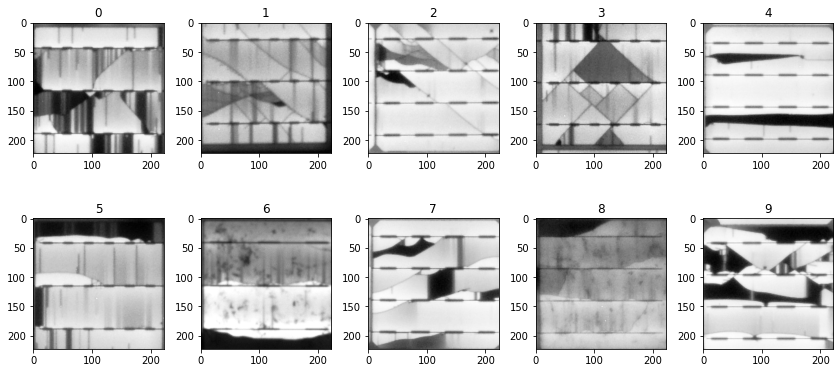

In [11]:
# Load 100 examples and name the category for it. Category is like a title for images
n_samples = 10
isolated, clean, all_others = get_n_samples(n_samples)
plot_10(isolated.images)

# EDA 
Isolated Cracks have the following defining features:

- They are darker regions (areas of low luminesence) compared to the rest of the cell, and are often 'dead', which present as black in these images. 
- They are often irregular in shape, but they can be rectangular in shape. 
- They occur typically in the presence of other cracks. 

Potential Approach
- Inverting the image so that the dark regions are brigher regions (not neccesary but just more intuitive when 'subtracting' information we don't want). 
- Thresholding to keep only the brightest (previously darker) regions.
- Potential filtering of vertical lines, so the model doesn't confuse dark vertical fingers
- Potential filtering of horizontal lines, so the model doesn't the busbars. 
- Application of a blob detector to highlight the blobs.
- Erode the background


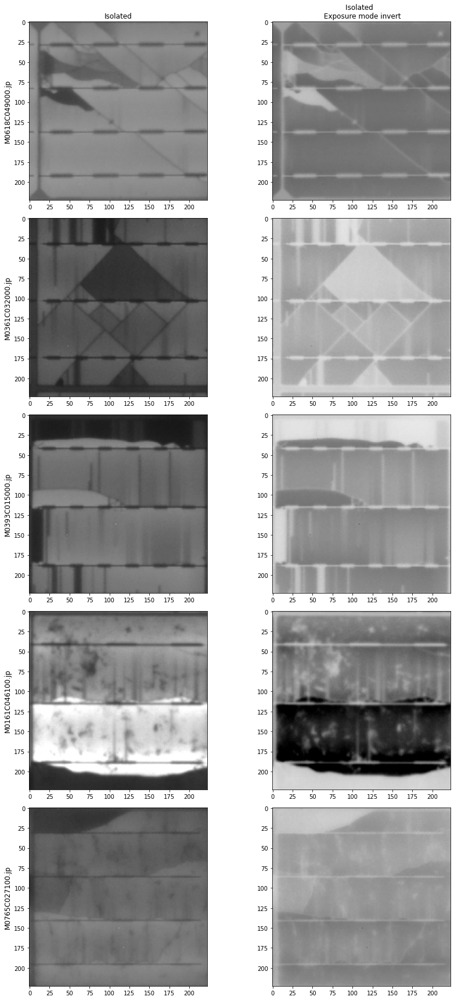

In [12]:
## INVERT IMAGES ## 
original, inverted = Exposure('invert') << isolated
_ = Show(num_images=5, seed=seed) << (original, inverted)

Next we apply thresholding the images using Multi-Otsu thresholding, which is a method of finding threshold boundaries which maximises the inter-bin variances. Because of this, we can apply a local threshold for each image, rather than a global value for all images. This is particularly useful because the incoming images are not normalised/scaled to a global value - a bright region on a bad cell may actually in absolute intensity correspond to a poor region on a good cell. 

In [13]:
## Apply multi-otsu thresholding, we experiment with 2 and 3 thresholds. 
_, thresholded_2 = (ThresholdMultiotsu(classes=2) << (Exposure('invert') << isolated))
_, thresholded_3 = (ThresholdMultiotsu(classes=3) << (Exposure('invert') << isolated))

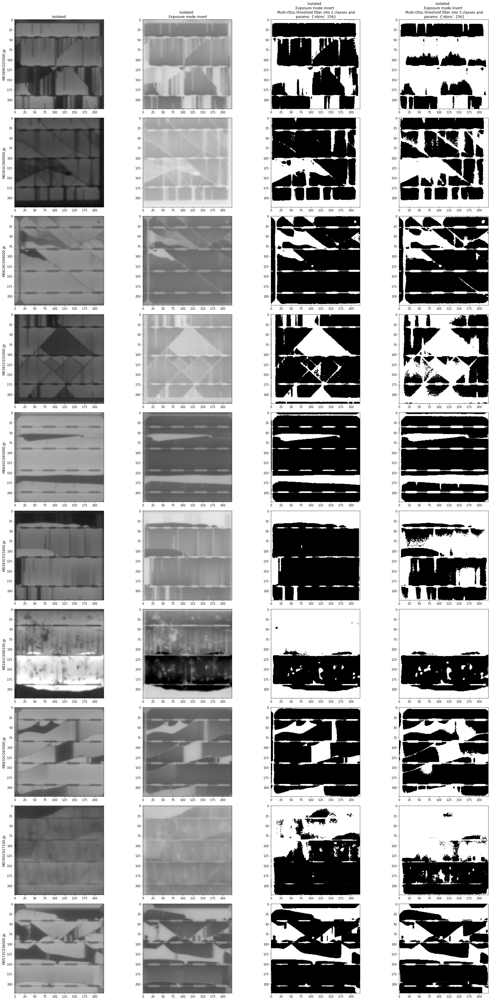

In [14]:
_ = Show(num_images=10, seed=seed) << (original, inverted, thresholded_2, thresholded_3)

This looks pretty reasonable for only two rather simplistic transforms. Having two threshold levels appears to be the right balance between feature vs noise extraction. 

There are a few issues though:

- The busbar pattern is occasionally picked up during the thresholding. 
- Misaligned border crop regions are also picked up during the thresholding.
- Sometimes cracks and thin diagonal and vertical lines are remaining after thresholding. 

The busbar effect can potentially be countered by isolating the thresholded regions of the busbar such that the thresholded pattern corresponding to the busbar is 

The cracks and thin diagonal lines can perhaps be addressed by a combination of:

- Blurring the image with a gaussian kernel may help with avoiding the pick up of unwanted high frequency features such as cracks and thin vertical lines. 
- Band pass filtering to remove high frequency information. 


# Busbar removal

A custom function, [BusbarMask](https://github.com/atox120/w281_finalproject_solascan/blob/9f2307484c8493cc1430de7f463a25f96225b6bf/app/custom.py#L261) was built to detect and remove the busbars via masking. The rough algorithm for this is as follows:
- A Farid horizontal filter is used to extract any horizontal gradients and the returned signal is summed along the rows and squared, so that the negative values of the gradient are now positive.
- A series of filters are applied on the 1D signal, including an edge mask, which ignores any signal within a cerntain number of pixels of the top and bottom edge, since we know there should not be any busbars at the very edges.
- A gaussian blur is then applied to the remaining signal to find the midpoint of the busbar, since each edge of the busbar creates a peak, and we are interested in the centre. THis blur has the effect of creating a maxima in between the two peaks, roughly corresponding to the midpoint. 
- A peak finding algorithm is used to find the peaks, which correspond to the centre of the busbar positions.
- The remaining peaks are then 'broadened' by an input factor to widen the mask. 
- The values are then thresholded to be either 1 or zero and then the mask is lengthened across all columns, to mask out the full row. 
- The resulting mask is then either multiplied by the image or returned as a one-hot encoded matrix. 

An example of this implementation is shown below. In the below, 10 images are shown, and then in the next sequence those same images with the busbar mask/window is then applied. 

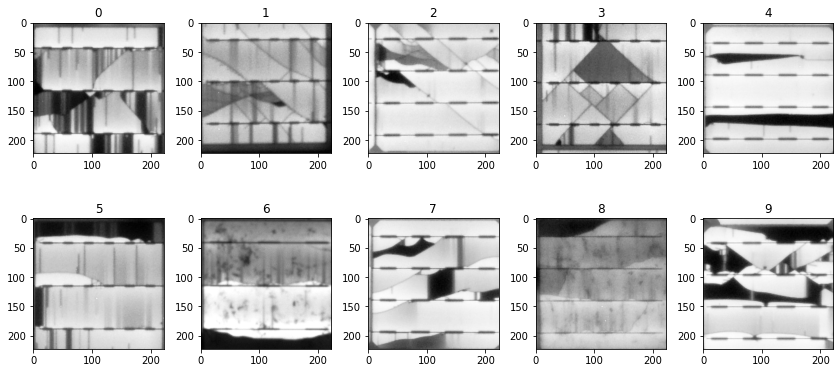

In [15]:
# Original Images
plot_10(isolated.images)

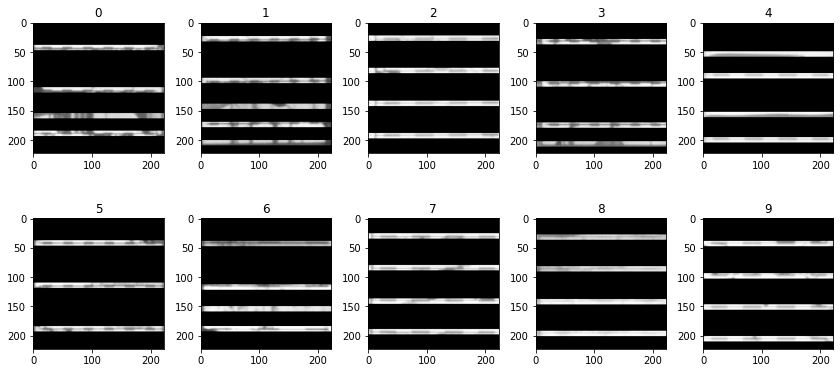

In [16]:
# masked_images
masks = BusbarMask(edge_buffer=15, min_spacing=30, broadening=4).apply(isolated.images)
plot_10(isolated.images * masks)

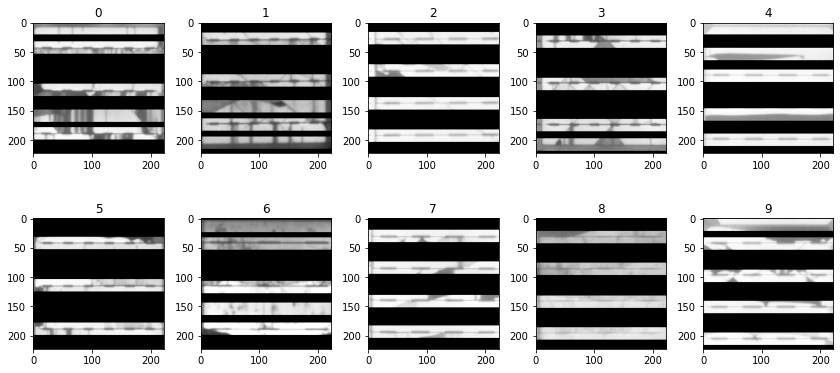

In [17]:
# masked_images - example thick broadening of the window. 
masks = BusbarMask(edge_buffer=10, min_spacing=30, broadening=10).apply(isolated.images)
plot_10(isolated.images * masks)

The algorithm has worked reasonably well, with most images having the correct busbars extracted. A few issues remain however since in a few images an edge or thick crackline is confused with a busbar. Thus there is always an issue if the original image crop is poor - sice this means that the edge buffer cannot be set accurately. 

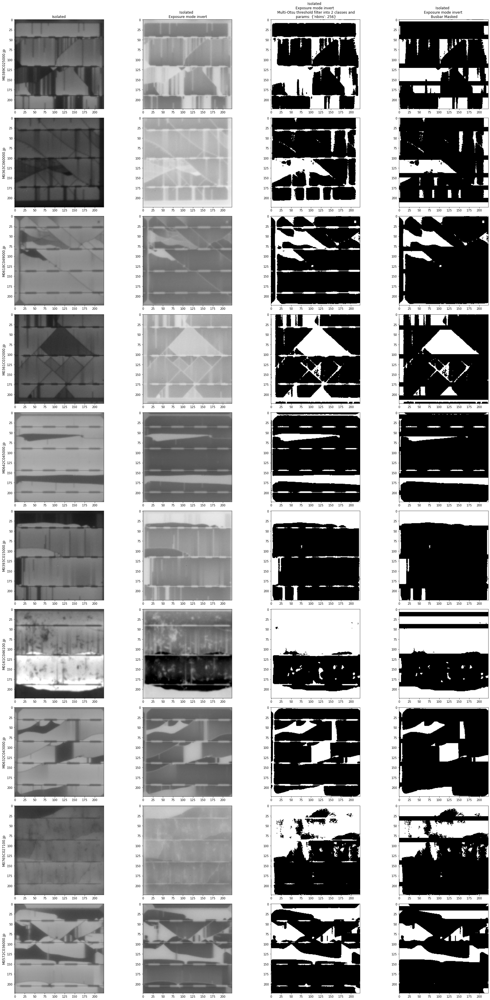

In [18]:
# Busbar removal example in pipeline
# Detect Busbars and remove masks
_ , thresholded_masked = BusbarMask(edge_buffer=10, min_spacing=25, broadening=5) \
        << (ThresholdMultiotsu(classes=2) << (Exposure('invert') << isolated))

_ = Show(num_images=10, seed=seed) << (original, inverted, thresholded_2, thresholded_masked)

## Crack and Line removal

In the thresholded images above, often lines and cracks which are thin are being picked up in the final thresholded image. These are different in that they are thin dark lines, as opposed to thick dark blobs, rather than lines/cracks.

One simple approach may be to downsample and blur the input image, as this will reduce the high frequency information in the image. A custom function [DownsampleBlur](https://github.com/atox120/w281_finalproject_solascan/blob/9f2307484c8493cc1430de7f463a25f96225b6bf/app/transforms.py#L289) was written to down sample the image and blur in the following way:

- Downsample the image using a nearest neighbours interpolation method. 
- The image was then upsampled using a cubic interpolation.
- A gaussian blur was then applied with standard deviation = 5 and size = 21. 

An example implementation is below.

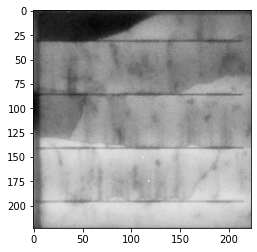

In [19]:
plt.imshow(isolated.images[8], cmap = 'Greys_r')

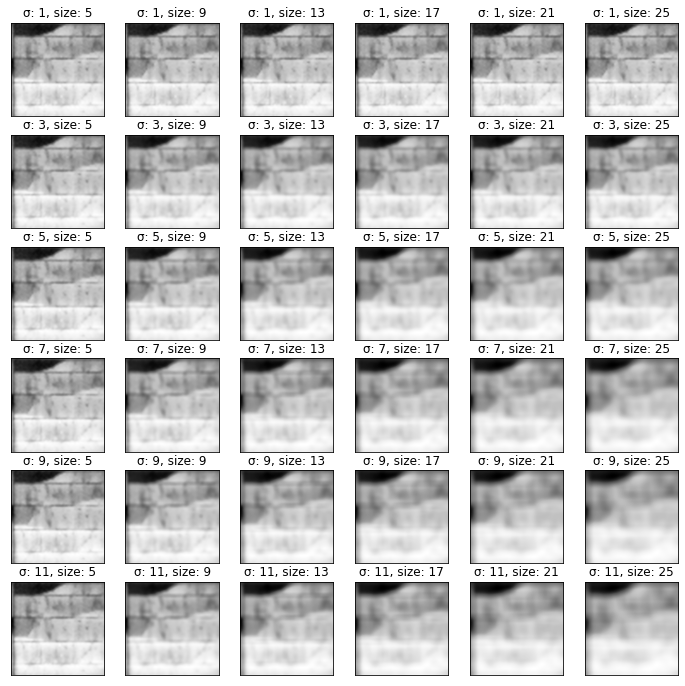

In [20]:
# let's try a range of sigma's and sizes:
# Sweep Parameters
test_img = isolated.images[8]
sigma_list = [1, 3, 5, 7, 9, 11]
size_list = [5, 9, 13, 17, 21, 25]

#Blur images 
blurred_images = []
for sigma in sigma_list:
    for size in size_list:
        #Blur and append
        blurred = DownsampleBlur(sigma=sigma, size=size).apply(test_img[np.newaxis,:,:])
        blurred_images.append(blurred.reshape(test_img.shape))

# Plot Results
fig, axs = plt.subplots(6,6, figsize=(12,12))
q = 0
for i in range(6):
    for k in range(6):
        axs[i][k].imshow(blurred_images[q], cmap='Greys_r')
        axs[i][k].yaxis.set_visible(False)
        axs[i][k].xaxis.set_visible(False)
        axs[i][k].set_title(f'σ: {sigma_list[i]}, size: {size_list[k]}' )
        q += 1

In the above image we can see there is some degree of customisation in the application of the blur. At sigma >= 5 and size >= 13, we are starting to see effective blurring of the thin crack lines. 

One issue is that at higher sigma and size values, the ability to distinguish the multicrystalline defect clusters is diminished. Similarly, if the sigma and size is too large, we lose the ability to distinguish thin cracks from darker regions. We therefore choose a smaller sigma value of 3 and size 17, since the thin crack lines we are trying to filter are generally quite thin. 

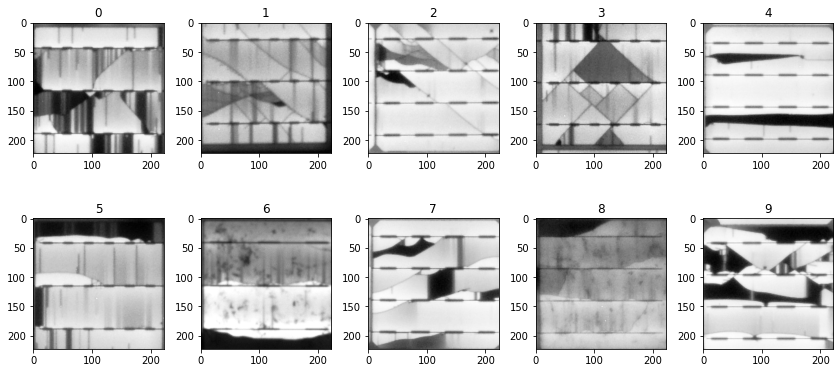

In [21]:
# Original Images
plot_10(isolated.images)

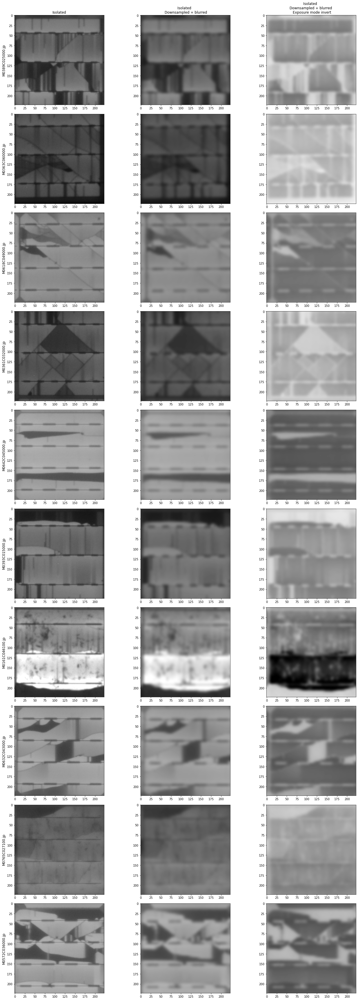

In [22]:
_ , ds_blurred = (DownsampleBlur(sigma=3, size=17) << isolated)
_, inverted_blurred = Exposure('invert') << (DownsampleBlur(sigma=3, size=17) << isolated)
_ = Show(num_images=10, seed=seed) << (original, ds_blurred, inverted_blurred)

## Classifier Development

In this section we test the sequential application of filters/feature extraction steps sequentially, including:

1. Downsample Blur of the image with a gaussian kernel.
2. Invert the exposure, and threshold the image using a Multi-Otsu thresholding algorithm.
3. Remove the busbars.

This will be compared a benchmark model without transformation. We compare the transforms in a binary classification excercise vs all other classes, and against the 'clean' class which has no defects present. These represent a lower and upper bound for performance, since there are multiple classes per image.  

In [23]:
# Get images
n_samples = 1200
isolated_2000, clean_2000, all_others_2000 = get_n_samples(n_samples)
print('Samples loaded')

# Apply transforms sequentially
isolated_MO =  isolated_pipeline(isolated_2000, 1, 'isolated') # Thresholding 
isolated_BL =  isolated_pipeline(isolated_2000, 2, 'isolated') # Thresholding + blurring
isolated_BB  = isolated_pipeline(isolated_2000, 3, 'isolated') # Thresholding + blurring + busbar removal

# same as above but for the 'clean' class
clean_MO =  isolated_pipeline(clean_2000, 1, 'clean')
clean_BL =  isolated_pipeline(clean_2000, 2, 'clean')
clean_BB  = isolated_pipeline(clean_2000, 3, 'clean')

# same as above but for the 'others class'
all_others_MO =  isolated_pipeline(all_others_2000, 1, "all_others")
all_others_BL =  isolated_pipeline(all_others_2000, 2, "all_others")
all_others_BB  = isolated_pipeline(all_others_2000, 3, "all_others")  
print("transforms complete")

# Perform transforms on the relevant groups
# No transform
vclean_matrix, vclean_labels = prepare_lists([isolated_2000, clean_2000])
vao_matrix, vao_labels = prepare_lists([isolated_2000, all_others_2000])
# Thresholding + Inversion
mo_clean_matrix, mo_clean_labels = prepare_lists([isolated_MO, clean_MO])
mo_ao_matrix, mo_ao_labels = prepare_lists([isolated_MO, all_others_MO])
# Sato + Thresholding
bl_clean_matrix, bl_clean_labels = prepare_lists([isolated_BL, clean_BL])
bl_ao_matrix, bl_ao_labels = prepare_lists([isolated_BL, all_others_BL])
# Sato + Thresholding + fft
bb_clean_matrix, bb_clean_labels = prepare_lists([isolated_BB, clean_BB])
bb_ao_matrix, bb_ao_labels = prepare_lists([isolated_BB, all_others_BB])
print('processing complete')

Samples loaded
transforms complete
processing complete


## TSNE Transformed Data

To get an indication on the classes within the data, we applied a TSNE algorithm to visualise the classes in 2 dimensional space. PCA was also evaluatated, but did not perform as well as PCA and is omitted. 

### TSNE transform - raw data 

In [24]:
# format labels
vclean_labels = [x.lower() for x in vclean_labels]
vao_labels = [x.lower() for x in vao_labels]

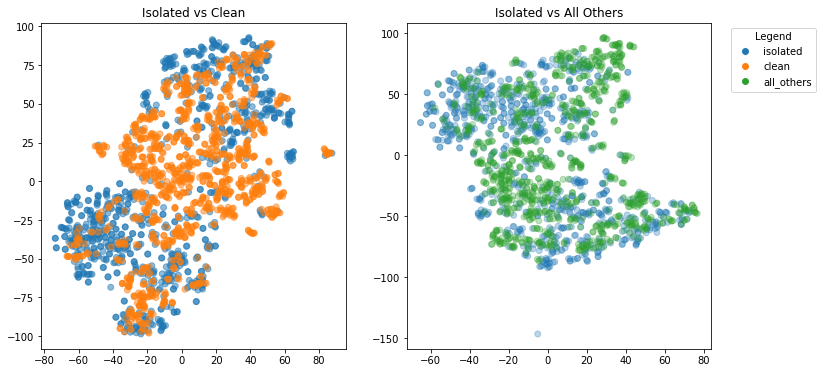

In [25]:
plot_comparison(vclean_matrix, vao_matrix, vclean_labels, vao_labels)

As is, there is significant overlap in the data and not well separated. This is expected, since images typically have multiple instances of a defect. 

### TSNE Transformed - Blurred

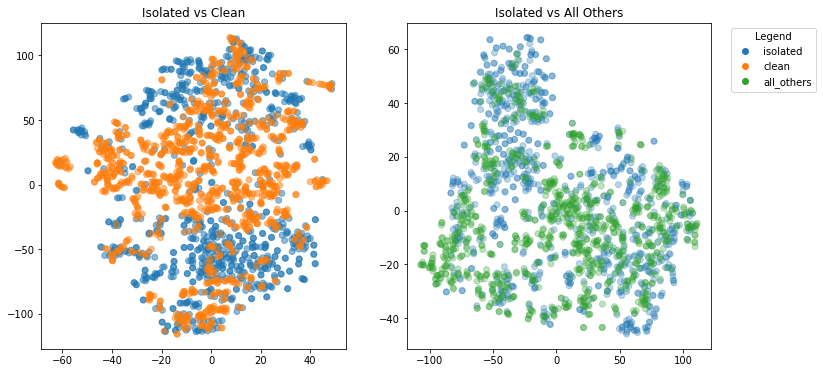

In [26]:
# With downsample blurring
plot_comparison(mo_clean_matrix, mo_ao_matrix, mo_clean_labels, mo_ao_labels)

This is similar to before, which is perhaps unsurprising since we have only blurred the image and not subtracted any image information.

### TSNE Transform after Thresholding

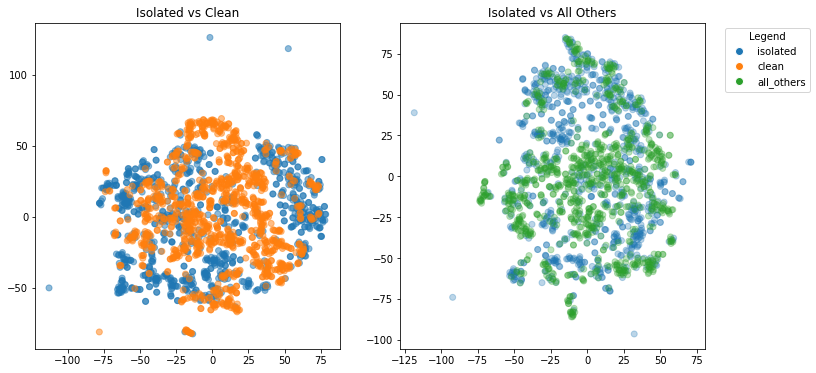

In [27]:
plot_comparison(bl_clean_matrix, bl_ao_matrix, bl_clean_labels, bl_ao_labels)

Overall this is pretty poor clustering, although we are starting to see regions where perhaps there are some datapoints isolated fomr each other.

### TSNE Transform after Thresholding and Busbar Removal

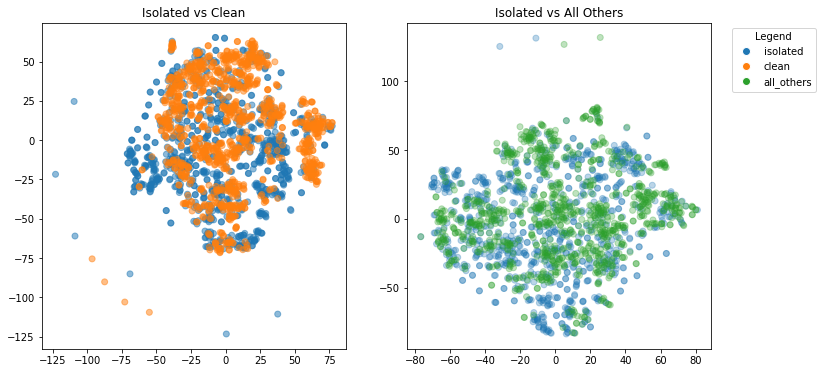

In [28]:
plot_comparison(bb_clean_matrix, bb_ao_matrix, bb_clean_labels, bb_ao_labels)

The above plots suggest that there is no simple separation in the data, which is difficult to assess since more than one classes occur per image. 

In the following section, we train classification models, evaluating the step change in performance as the filters are introduced. 

## Classifier development

We test various classifiers at different stages of the pipelines. We test the following sequence of transformations:

- With/Without PCA performed on the data AFTER transform (i.e. after feature extraction). 
- Classifiers: Logistic Regression, Kmeans, Gradient Boosting Algorithm 
- Data Splits: Defected vs Clean, Defected vs 'All Others' (including clean). 
- Transforms: Base model vs Blurring, Blurring + Multi Otsu Thresholding, Blurring + Multi Otsu Thresholding + Busbar Removal

We report [balanced accuracy score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.balanced_accuracy_score.html) as the primary metric. 

#### Logistic Regression

In [29]:
# Loop 
data_clean = ((isolated_2000, clean_2000), (isolated_2000, clean_2000), (isolated_MO, clean_MO), (isolated_BL, clean_BL), (isolated_BB, clean_BB))
data_ao = ((isolated_2000, all_others_2000), (isolated_2000, all_others_2000), (isolated_MO, all_others_MO), (isolated_BL, all_others_BL), (isolated_BB, all_others_BB))
model_type = LogisticRegression
model_string = 'Base Model'
titles = [f'{model_string} - No PCA', f'{model_string} w/PCA', f'{model_string} w/PCA  + Blur',
         f'{model_string} w/PCA  + Blur + Thresholding', f'{model_string} w/PCA  + Blur + Thresholding + Busbar Removal']

# Write Params
pca_dims = [None, 800, 800, 800, 800]
model_params = [{'penalty': 'l2', 'seed': 4156, 'pca_dims': pca_dims[x], 'max_iter':500} for x in range(len(data_clean))]

# Run classifiers on clean vss all others
print('#------      Results vs Clean      ------#')
scores_clean = loop_classifier(data_clean, model_type, titles, model_params, return_misclassified=False)
print('#------    Results vs All Others   ------#')
scores_all_others = loop_classifier(data_ao, model_type, titles, model_params, return_misclassified=False)

#------      Results vs Clean      ------#


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Base Model - No PCA
81.7614 %
          Pred 0    Pred 1
------  --------  --------
True 0       222        18
True 1        51       125

Base Model w/PCA
80.5682 %
          Pred 0    Pred 1
------  --------  --------
True 0       219        21
True 1        53       123

Base Model w/PCA  + Blur
80.4924 %
          Pred 0    Pred 1
------  --------  --------
True 0       220        20
True 1        54       122

Base Model w/PCA  + Blur + Thresholding
81.0606 %
          Pred 0    Pred 1
------  --------  --------
True 0       205        35
True 1        41       135

Base Model w/PCA  + Blur + Thresholding + Busbar Removal
80.5682 %
          Pred 0    Pred 1
------  --------  --------
True 0       204        36
True 1        42       134
#------    Results vs All Others   ------#


/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Base Model - No PCA
72.1084 %
          Pred 0    Pred 1
------  --------  --------
True 0       164        39
True 1        64       111

Base Model w/PCA
71.6552 %
          Pred 0    Pred 1
------  --------  --------
True 0       161        42
True 1        63       112

Base Model w/PCA  + Blur
68.9951 %
          Pred 0    Pred 1
------  --------  --------
True 0       156        47
True 1        68       107

Base Model w/PCA  + Blur + Thresholding
69.3892 %
          Pred 0    Pred 1
------  --------  --------
True 0       146        57
True 1        58       117

Base Model w/PCA  + Blur + Thresholding + Busbar Removal
69.3103 %
          Pred 0    Pred 1
------  --------  --------
True 0       148        55
True 1        60       115


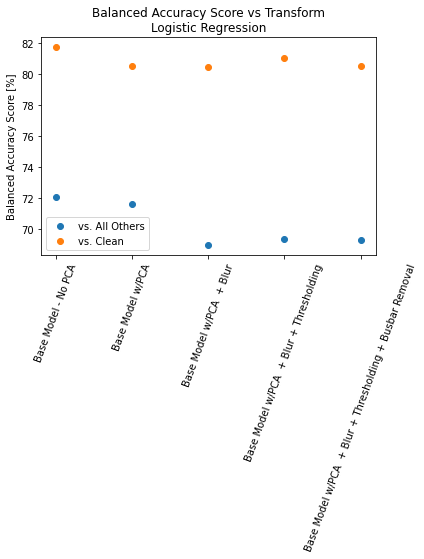

In [30]:
plot_classifier_summary((scores_all_others, scores_clean), titles, 'Logistic Regression')

Summary - Base Case

- Unfortunately, the transformations do not appear to have improved the ability of the base Logistic Regression model to identify the defects present in the image. 
- There is not a large difference in the scores vs. clean images for the different transforms and PCA. 
- PCA doesn't appear to reduce performance, however it does have an effect on speed and convergence. 

### KMeans

In [31]:
from sklearn.cluster import KMeans

# Loop 
data_clean = ((isolated_2000, clean_2000), (isolated_2000, clean_2000), (isolated_MO, clean_MO), (isolated_BL, clean_BL), (isolated_BB, clean_BB))
data_ao = ((isolated_2000, all_others_2000), (isolated_2000, all_others_2000), (isolated_MO, all_others_MO), (isolated_BL, all_others_BL), (isolated_BB, all_others_BB))
model_type = KMeans
model_string = 'KMeans'
titles = [f'{model_string} - No PCA', f'{model_string} w/PCA', f'{model_string} w/PCA  + Blur',
         f'{model_string} w/PCA  + Blur + Thresholding', f'{model_string} w/PCA  + Blur + Thresholding + Busbar Removal']

# Write Params
pca_dims = [None, 800, 800, 800, 800]
model_params = [{'n_clusters':2, 'seed': 4156, 'pca_dims': pca_dims[x], 'max_iter':500} for x in range(len(data_clean))]

# Run classifiers on clean vss all others
print('#------      Results vs Clean      ------#')
scores_clean = loop_classifier(data_clean, model_type, titles, model_params, return_misclassified=False)
print('#------    Results vs All Others   ------#')
scores_all_others = loop_classifier(data_ao, model_type, titles, model_params, return_misclassified=False)

#------      Results vs Clean      ------#

KMeans - No PCA
64.9053 %
          Pred 0    Pred 1
------  --------  --------
True 0       182        58
True 1        81        95

KMeans w/PCA
35.0947 %
          Pred 0    Pred 1
------  --------  --------
True 0        58       182
True 1        95        81

KMeans w/PCA  + Blur
65.3977 %
          Pred 0    Pred 1
------  --------  --------
True 0       183        57
True 1        80        96

KMeans w/PCA  + Blur + Thresholding
63.8636 %
          Pred 0    Pred 1
------  --------  --------
True 0       222        18
True 1       114        62

KMeans w/PCA  + Blur + Thresholding + Busbar Removal
38.2386 %
          Pred 0    Pred 1
------  --------  --------
True 0         9       231
True 1        48       128
#------    Results vs All Others   ------#

KMeans - No PCA
40.0985 %
          Pred 0    Pred 1
------  --------  --------
True 0        70       133
True 1        95        80

KMeans w/PCA
59.9015 %
          Pred 0    P

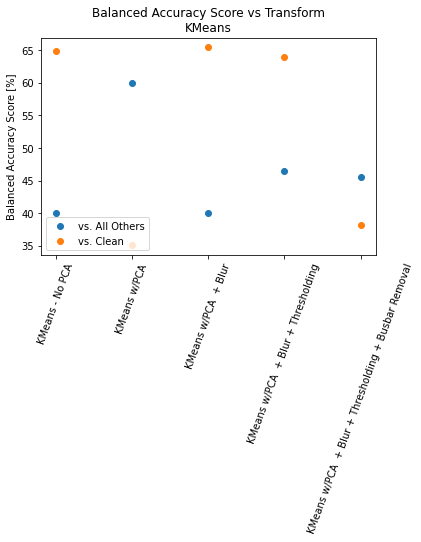

In [32]:
plot_classifier_summary((scores_all_others, scores_clean), titles, 'KMeans')

The results using KMeans does not appear to have worked very well, which is perhaps unsurprising given that the TSNE plots did not show good separation of the data.

### Gradient Boosting Classifier

#------      Results vs Clean      ------#

Gradient Boosting Classifier w/PCA
87.3811 %
          Pred 0    Pred 1
------  --------  --------
True 0       227        14
True 1        34       141

Gradient Boosting Classifier w/PCA  + Blur
88.8880 %
          Pred 0    Pred 1
------  --------  --------
True 0       226        15
True 1        28       147

Gradient Boosting Classifier w/PCA  + Blur + Thresholding
85.1500 %
          Pred 0    Pred 1
------  --------  --------
True 0       219        22
True 1        36       139

Gradient Boosting Classifier w/PCA  + Blur + Thresholding + Busbar Removal
84.8405 %
          Pred 0    Pred 1
------  --------  --------
True 0       212        29
True 1        32       143
#------    Results vs All Others   ------#

Gradient Boosting Classifier w/PCA
82.9592 %
          Pred 0    Pred 1
------  --------  --------
True 0       187        25
True 1        37       129

Gradient Boosting Classifier w/PCA  + Blur
83.2860 %
          Pred 0   

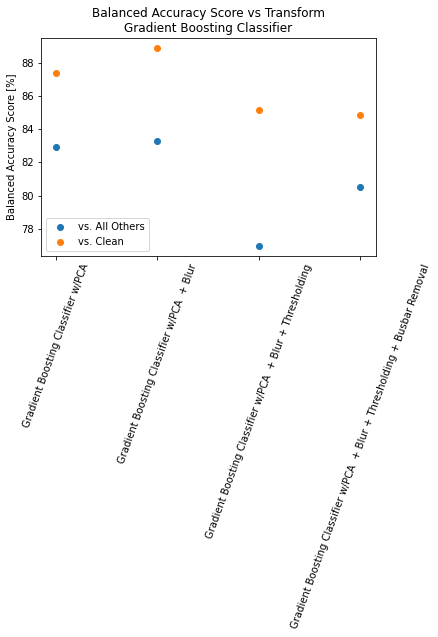

In [33]:
from sklearn.ensemble import GradientBoostingClassifier


# Loop 
data_clean = ((isolated_2000, clean_2000), (isolated_MO, clean_MO), (isolated_BL, clean_BL), (isolated_BB, clean_BB))
data_ao = ((isolated_2000, all_others_2000), (isolated_MO, all_others_MO), (isolated_BL, all_others_BL), (isolated_BB, all_others_BB))
model_type = GradientBoostingClassifier
model_string = 'Gradient Boosting Classifier'
titles = [f'{model_string} w/PCA', f'{model_string} w/PCA  + Blur',
         f'{model_string} w/PCA  + Blur + Thresholding', f'{model_string} w/PCA  + Blur + Thresholding + Busbar Removal']

# Write Params
pca_dims = [800, 800, 800, 800]
model_params = [{'seed': 14376,'n_estimators': 300, 'max_depth': 4, 'learning_rate': 0.1, 'pca_dims': pca_dims[x]} for x in range(len(data_clean))]

# Run classifiers on clean vss all others
print('#------      Results vs Clean      ------#')
scores_clean, conf, examples_cl = loop_classifier(data_clean, model_type, titles, model_params, return_misclassified=True)
print('#------    Results vs All Others   ------#')
scores_all_others, conf, examples_ao = loop_classifier(data_ao, model_type, titles, model_params, return_misclassified=True)

plot_classifier_summary((scores_all_others, scores_clean), titles, 'Gradient Boosting Classifier')

 Although the scores are higher overall, we still do not see an overall improvement with the implementation of the feature extraction. There is a slight improvement with gaussian blur, however the thresholding and busbar removal do not appear to assist the classifier. 

### CNN

We now train a CNN to compare the accuracy of our model vs a neural network. The CNN has the following attributes:

- 1x input channel.
- Convolution: 2x20 channel convolutional layers, convolved using a 3x3 kernel. 
- Output layers: 2 x fully connected dense layers of length 300.  
- Optimiser: Stochastic Gradient Descent, Nesterov Algorithm and a LR of 0.001.
- Scheduler: Linear decay. 
- Predicting 2 output classes. 


In [145]:
from app.models import ModelNN

#Define Parameters
scores_vclean = []
legends_vclean = []
lr = 0.0001

model_string = 'CNN'
titles = [f'{model_string} w/PCA', f'{model_string} w/PCA  + Blur',
         f'{model_string} w/PCA  + Blur + Thresholding', f'{model_string} w/PCA  + Blur + Thresholding + Busbar Removal']
# Set Parameters
data_clean = ((isolated_2000, clean_2000), (isolated_MO, clean_MO), (isolated_BL, clean_BL), (isolated_BB, clean_BB))

optimizer_params = {'name': 'sgd', 'lr': lr, 'nesterov': True, 'momentum': 0.9}
scheduler_params = {'lr_min': lr/100, 't_mul': 3}
model_params = {'num_output_classes': 2, 'channels': ((1, 5), (20, 3), (20, 3))}

# Loop
i=0
for data in data_clean:
    model = ModelNN(data[0], data[1], model_params, optimizer_params, scheduler_params, model_type='cnn')
    score = model.fit(num_epochs=20)
    print(f"{titles[i]}: {score:.2f}")
    scores_vclean.append(score)
    legends_vclean.append(titles[i])
    i+=1

Epoch 0 train loss 0.5612 val loss 0.5960 lr 0.00009941
Epoch 1 train loss 0.4264 val loss 0.4803 lr 0.00009762
Epoch 2 train loss 0.3663 val loss 0.4971 lr 0.00009467
Epoch 3 train loss 0.3227 val loss 0.4979 lr 0.00009063
Epoch 4 train loss 0.2902 val loss 0.5017 lr 0.00008561
Epoch 5 train loss 0.2652 val loss 0.5053 lr 0.00007972
Epoch 6 train loss 0.2449 val loss 0.5090 lr 0.00007311
Epoch 7 train loss 0.2281 val loss 0.5117 lr 0.00006594
Epoch 8 train loss 0.2139 val loss 0.5149 lr 0.00005839
Epoch 9 train loss 0.2020 val loss 0.5180 lr 0.00005065
Epoch 10 train loss 0.1922 val loss 0.5211 lr 0.00004290
Epoch 11 train loss 0.1839 val loss 0.5239 lr 0.00003535
Epoch 12 train loss 0.1773 val loss 0.5269 lr 0.00002816
Epoch 13 train loss 0.1721 val loss 0.5301 lr 0.00002153
Epoch 14 train loss 0.1681 val loss 0.5329 lr 0.00001560
Epoch 15 train loss 0.1652 val loss 0.5348 lr 0.00001054
Epoch 16 train loss 0.1631 val loss 0.5352 lr 0.00000646
Epoch 17 train loss 0.1617 val loss 0.535

In [146]:
# Do Comparison vs All other classes. 
data_ao = ((isolated_2000, all_others_2000), (isolated_MO, all_others_MO), (isolated_BL, all_others_BL), (isolated_BB, all_others_BB))
from app.models import ModelNN

#Define Parameters
scores_vao = []
legends_vao = []
lr = 0.0001

model_string = 'CNN'
titles = [f'{model_string} w/PCA', f'{model_string} w/PCA  + Blur',
         f'{model_string} w/PCA  + Blur + Thresholding', f'{model_string} w/PCA  + Blur + Thresholding + Busbar Removal']
# Set Parameters
data_ao = ((isolated_2000, all_others_2000), (isolated_MO, all_others_MO), (isolated_BL, all_others_BL), (isolated_BB, all_others_BB))

optimizer_params = {'name': 'sgd', 'lr': lr, 'nesterov': True, 'momentum': 0.9}
scheduler_params = {'lr_min': lr/100, 't_mul': 3}
model_params = {'num_output_classes': 2, 'channels': ((1, 5), (20, 3), (20, 3))}

# Loop
i=0
for data in data_ao:
    model = ModelNN(data[0], data[1], model_params, optimizer_params, scheduler_params, model_type='cnn')
    score = model.fit(num_epochs=20)
    print(f"{titles[i]}: {score:.2f}")
    scores_vao.append(score)
    legends_vao.append(titles[i])
    i+=1

Epoch 0 train loss 0.6640 val loss 0.6877 lr 0.00009942
Epoch 1 train loss 0.6086 val loss 0.6142 lr 0.00009763
Epoch 2 train loss 0.5678 val loss 0.5837 lr 0.00009468
Epoch 3 train loss 0.5348 val loss 0.5611 lr 0.00009064
Epoch 4 train loss 0.5069 val loss 0.5425 lr 0.00008562
Epoch 5 train loss 0.4829 val loss 0.5268 lr 0.00007973
Epoch 6 train loss 0.4621 val loss 0.5133 lr 0.00007312
Epoch 7 train loss 0.4441 val loss 0.5017 lr 0.00006595
Epoch 8 train loss 0.4282 val loss 0.4920 lr 0.00005840
Epoch 9 train loss 0.4145 val loss 0.4836 lr 0.00005066
Epoch 10 train loss 0.4026 val loss 0.4770 lr 0.00004292
Epoch 11 train loss 0.3925 val loss 0.4715 lr 0.00003536
Epoch 12 train loss 0.3841 val loss 0.4668 lr 0.00002817
Epoch 13 train loss 0.3773 val loss 0.4628 lr 0.00002154
Epoch 14 train loss 0.3720 val loss 0.4596 lr 0.00001561
Epoch 15 train loss 0.3680 val loss 0.4575 lr 0.00001055
Epoch 16 train loss 0.3650 val loss 0.4566 lr 0.00000647
Epoch 17 train loss 0.3630 val loss 0.456

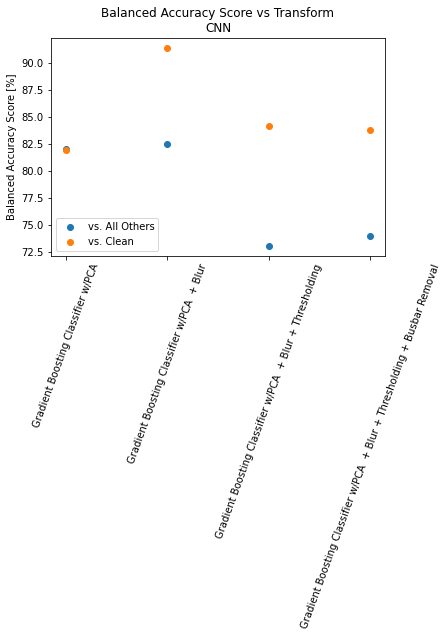

In [149]:
plot_classifier_summary((scores_vao, scores_vclean), titles, 'CNN')

### Misclassified Analysis

In this section we look at some examples of misclassifications. Since the Gradient Boosting Classifier had similar performance to the CNN, and is simpler to integrate into our pipeline, we explore the misclassified examples from this classifier. We specifically explore those from the PCA + Gaussian Blur examples. 

/opt/conda/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3251: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  exec(code_obj, self.user_global_ns, self.user_ns)


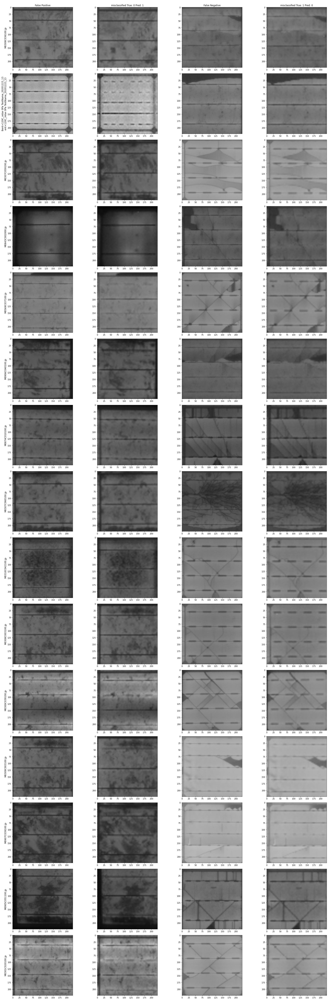

(<__main__.misclass at 0x7f2616003130>,
 <app.utils.ImageWrapper at 0x7f2616bfb760>)

In [34]:
### Misclassified Analysis
blur_FP, blur_FN = examples_cl[1]
FP, FN = load_misclass(examples_cl[1])
Show(num_images=20, seed=seed) << (FP, blur_FP[0], FN, blur_FN[1])

Examples of the False Positives reveals that the model is grequently misclassifying the defect clusters of the multicrystalline wafers as isolated cracks. For the False negatives, the isolated cracks tend to be towards the edges of the cell, and they appear to be 'gre' - i.e. not dark enough to be isolated crack instances. 

This is in part an issue with the dataset, since in some of the images above these classify as Resistive cracks. Nevertheless, there are instances where clearly dark regions have been omitted. 

Next we inspect the instances where the model fails on the thresholded pipeline:

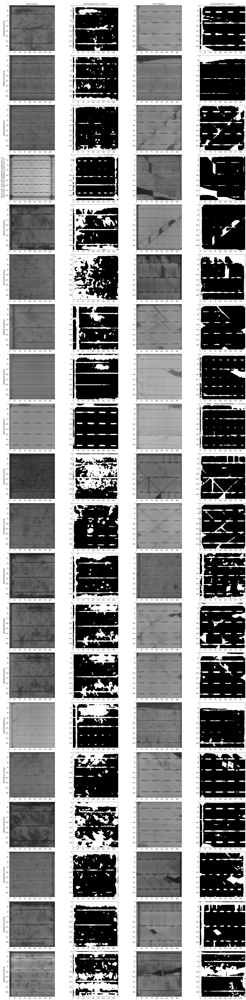

(<__main__.misclass at 0x7f26145b04f0>,
 <app.utils.ImageWrapper at 0x7f2616bfb5e0>)

In [35]:
### Misclassified Analysis
blur_FP, blur_FN = examples_cl[2]
FP, FN = load_misclass(examples_cl[2])
Show(num_images=20, seed=seed) << (FP, blur_FP[0], FN, blur_FN[1])

For the thresholded and blurred images, it is interesting to note the instances where the model fails:
    
False Positives:

- Again the multicrystalline texture is frequently misclassified and accentuated as a defect. 
- There are some issues where due to the border crop, these dark regions are interfering with the classification accuracy.
- Some dark regions are dark for other reasons, such as handling or contamination however have been misclassified.
- Interestingly, some clean images are misclassified since the multiotsu thresholding, since it separates into 4 classes, accentuates the bottom threshold, even if it is a clean region. 

False Negatives 
- the border crop may be an issue here. Sometimes isolated regions are along the edge of the cell, but this is confused with a non-aligned background region of the cell. 

The main issue is that comparing the clean vs the defected cells, there is not enough of a distinction between the two image categories. This confirms the intuition from the TSNE images, which showed poor segmentation across the two comparison classes. 

## Summary

Various filters and filtering algorithms were trialled to highlight isolated cracks. These include:

- Blurring the image, to remove thin lines - such as closed cracks. 
- Thresholding the image, to highlight the dark regions created by the isolated cracks. 
- Using a farid filter and a peak finding algorithm to mask out dark regions created by busbars. 

Chained sequences of these filters/transforms were applied, and a classifier comparing the accuracy of a binary classifer to classify isolated cracks vs a clean image or an isolated crack vs all other potential defects was also trialled. The following classifiers were used:

KMeans, Logistic Regression, CNN and Gradient Boosting Classifier. 

The best scores for each algorithm and the pipeline producing those scores are shown below. 

Results vs Clean:

| Isolated vs Clean   | **Best Score**      | **Transform** |
|---------------------|---------------------|----------:|
| KMeans              | PCA + Gaussian Blur |      65.4 |
| Logistic Regression | PCA                 |      81.7 |
| Gradient Boosting Classifier   | PCA + Gaussian Blur |      89.0 |
| CNN                 | PCA + Gaussian Blur |  **91.0** |

Results vs all other defects:

| **Isolated vs All Others**   | **Best Score**      | **Transform** |
|---------------------|---------------------|----------:|
| KMeans              | PCA + Gaussian Blur |      51.9 |
| Logistic Regression | PCA                 |      72.0 |
| Gradient Boosting Classifier | PCA                 |  **82.8** |
| CNN                 | PCA + Gaussian Blur |      82.0 |

Future work to improve the classifier could focus on two potential approaches:
- Segmentation of the multicrystalline texture against the other defects. 
- Proper handling of the poor border crop. 

Best pipeline:
- PCA + Gaussian Blur, using a Gradient Boosting Classifier